# Predicting IRI FMCG Sales for 2021

Datathon - Group Assignment

Team E - **William Kingwill, Julius von Selchow, Emily Yorke, Sydne-Aline Strasser, Tarek ElNoury, Alain Grullón**

Data - 


**--------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

## Agenda

**I. Python environment setup**

**II. Data source setup**

**III. Dataset Cleaning & Merging**
  
**IV. Explorative Data Analysis (EDA)**

  1. Visualizations
  2. Feature Factorization
  
**V. Machine Learning**
  1. Train-Test Splitting
  2. Correlations
  3. PCA Analysis
  
**VI. Prediction Algorithms**
  1. Regression
  2. Elastic Net
  3. Lasso Regression
  4. Random Forest
  5. XGBoost

**VII. Predicting casual & registered**


 
 
 **--------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

# 1. Environment setup

In [1]:
#load important libraries
import numpy as np
import pandas as pd
import pandas_profiling
import datetime
import math as m

# plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# ML libraries
import os
from sklearn import svm
from sklearn import metrics
from sklearn import preprocessing
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict, train_test_split
from sklearn.metrics import  accuracy_score

# TIME SERIES
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import adfuller, acf, pacf,arma_order_select_ic
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

# styling
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>")) # Increase cell width
display(HTML("<style>.rendered_html { font-size: 16px; }</style>")) # Increase font size
plt.style.use("fivethirtyeight")
sns.set_style('whitegrid')
sns.set_context('talk')

#import necessary libraries
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.impute  import SimpleImputer
from sklearn.compose import make_column_selector
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

# settings
import warnings
warnings.filterwarnings("ignore")

# 2. Data source setup

In [2]:
# read the sales dataset
sales_df = pd.read_excel('sales.xlsx')
sales_df.head()

,PERIOD,GEOGRAPHY,DEPARTAMENTO,SECCION,FAMILIA,CATEGORIA,sales_units,sales_value_euros,sales_volume
0,01-WEEK PERIOD ENDING 18/10/07,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),640432,3992668,1093703
1,01-WEEK PERIOD ENDING 18/10/07,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),255111,451289,384694
2,01-WEEK PERIOD ENDING 18/10/07,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),102114,179923,121847
3,01-WEEK PERIOD ENDING 18/10/07,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL POLVO (KG),31084,482948,28179
4,01-WEEK PERIOD ENDING 18/10/07,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,PAPILLAS (L/KG),40943,183145,30310


In [3]:
# read the economic factors datasets
meq_df = pd.read_excel('quarterly_eco_factors.xlsx')
meq_df.head()

,YEAR,QUARTER,MONTH,WEEK,GDP,UNEMP_RATE
0,2018,Q1,January,Week 1,0.029,0.1674
1,2018,Q1,January,Week 2,0.029,0.1674
2,2018,Q1,January,Week 3,0.029,0.1674
3,2018,Q1,January,Week 4,0.029,0.1674
4,2018,Q1,January,Week 5,0.029,0.1674


In [4]:
# read the economic factors datasets
mem_df = pd.read_excel('monthly_eco_factors.xlsx')
mem_df.head()

,Date,PPI,CPI,CCI
0,2020-09-30,-3.3,-26.3,-26.3
1,2020-08-31,-3.5,-28.7,-28.7
2,2020-07-31,-4.9,-25.6,-25.6
3,2020-06-30,-5.9,-25.6,-25.6
4,2020-05-31,-8.8,-28.8,-28.8


In [5]:
# read the weather dataset
weather_df = pd.read_excel('weather.xlsx')
weather_df.head()

,IRI_week,Province_Code,Date,Province,TEMP_MIN,TEMP_MAX,TEMP_AVG,PRECIPITATION
0,2040,0,2018-10-07,Tenerife,15.89,23.05,19.30,0.62
1,2040,1,2018-10-07,Alava,8.86,18.93,13.16,1.31
2,2040,2,2018-10-07,Albacete,11.14,25.74,18.13,0.00
3,2040,3,2018-10-07,Alicante,16.67,24.20,20.40,0.04
4,2040,4,2018-10-07,Almeria,19.27,23.89,21.67,0.01


In [6]:
# read the covid dataset
covid_df = pd.read_csv('covid.csv')
covid_df.head()

,provincia_iso,fecha,num_casos,num_casos_prueba_pcr,num_casos_prueba_test_ac,num_casos_prueba_otras,num_casos_prueba_desconocida
0,A,1/31/2020,0,0,0,0,0
1,AB,1/31/2020,0,0,0,0,0
2,AL,1/31/2020,0,0,0,0,0
3,AV,1/31/2020,0,0,0,0,0
4,B,1/31/2020,1,1,0,0,0


In [7]:
# read the horeca dataset
horeca_df = pd.read_excel('horeca.xlsx')
horeca_df.head()

,YEAR,QUARTER,MONTH,WEEK,General Index of turnover for market service sector (original),General Index of turnover for market service sector (adjusted for seasonal and calendar effects)
0,2018,Q1,ENERO,Week 1,7.4,5.7
1,2018,NaN,NaN,Week 2,7.4,5.7
2,2018,NaN,NaN,Week 3,7.4,5.7
3,2018,NaN,NaN,Week 4,7.4,5.7
4,2018,NaN,NaN,Week 5,7.4,5.7


# 3. Dataset Cleaning & Merging


## 3.1. Sales dataset

***We will get the week ending date from the date string:***

In [8]:
# Extracting the Dates for sales
sales_df["Date"] = sales_df["PERIOD"].str.split("ENDING ", n=1).str.get(1)
sales_df = sales_df.drop("PERIOD",axis=1)
sales_df.Date = pd.to_datetime(sales_df.Date, format='%y/%m/%d')

***Create year, month, week columns***

In [9]:
sales_df['year']  = pd.DatetimeIndex(sales_df['Date']).year
sales_df['month']  = pd.DatetimeIndex(sales_df['Date']).month
sales_df['week']  = pd.DatetimeIndex(sales_df['Date']).week

In [10]:
#check datatypes
list(sales_df.dtypes)

[dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('<M8[ns]'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64')]

In [11]:
#investigate sales dataset
sales_df.head(3)

,GEOGRAPHY,DEPARTAMENTO,SECCION,FAMILIA,CATEGORIA,sales_units,sales_value_euros,sales_volume,Date,year,month,week
0,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),640432,3992668,1093703,2018-10-07,2018,10,40
1,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),255111,451289,384694,2018-10-07,2018,10,40
2,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),102114,179923,121847,2018-10-07,2018,10,40


## 3.2. Weather dataset

***As we only have data for the sales accross the whole of spain, we will use the mean temp and percipitation across the regions***

In [12]:
#get the mean weather conditions across the country per week
weather_df = weather_df.pivot_table(['TEMP_MIN', 'TEMP_MAX',
                                     'TEMP_AVG', 'PRECIPITATION'], index = "Date")

In [13]:
list(weather_df.dtypes)

[dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64')]

In [14]:
weather_df.head(3)

,PRECIPITATION,TEMP_AVG,TEMP_MAX,TEMP_MIN
Date,,,,
2018-10-07,0.5524,17.8194,23.7630,12.6194
2018-10-14,4.5480,16.9946,21.4900,13.1004
2018-10-21,4.7054,15.3302,19.3368,12.1710


***Looking into the dates in the weather_df, we find that there are 2 weeks missing***

In [15]:
#add the weeks with nulls
weather_df.loc['2020-02-02'] = [np.nan,np.nan,np.nan,np.nan]
weather_df.loc['2020-02-16'] = [np.nan,np.nan,np.nan,np.nan]

***Need to make sure the date index is ordered right for ffill***

In [16]:
#set the inputed dates type datetime
weather_df = weather_df.reset_index()
weather_df.Date = pd.to_datetime(weather_df.Date)

#reset and order the index 
weather_df = weather_df.set_index("Date")
weather_df = weather_df.sort_index()

In [17]:
#check it is in the right order
#list(weather_df.index)

In [18]:
# fill nulls with forward fill
weather_df = weather_df.fillna(method = 'ffill')

In [19]:
weather_df.isnull().sum()

PRECIPITATION    0
TEMP_AVG         0
TEMP_MAX         0
TEMP_MIN         0
dtype: int64

## 3.3. Marcoeconomic dataset

Split into two datasets: 

meq_df has GDP, CPI, & unemployment rate

In [20]:
# Fixing the dates for KPI
meq_df.WEEK = meq_df["WEEK"].str.split("Week ", n=1).str.get(1)
meq_df.WEEK = meq_df["WEEK"].astype(int)
dates = meq_df.YEAR*100+meq_df.WEEK
meq_df['Date'] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

In [21]:
meq_df['MONTH'] = pd.DatetimeIndex(meq_df['Date']).month

In [22]:
meq_df.head(5)

,YEAR,QUARTER,MONTH,WEEK,GDP,UNEMP_RATE,Date
0,2018,Q1,1,1,0.029,0.1674,2018-01-07
1,2018,Q1,1,2,0.029,0.1674,2018-01-14
2,2018,Q1,1,3,0.029,0.1674,2018-01-21
3,2018,Q1,1,4,0.029,0.1674,2018-01-28
4,2018,Q1,2,5,0.029,0.1674,2018-02-04


In [23]:
meq_df.isnull().sum()

YEAR          0
QUARTER       0
MONTH         0
WEEK          0
GDP           0
UNEMP_RATE    0
Date          0
dtype: int64

mem_df has CCI & PPI

In [24]:
mem_df["month"] = pd.DatetimeIndex(mem_df['Date']).month
mem_df["year"] = pd.DatetimeIndex(mem_df['Date']).year

In [25]:
mem_df.head()

,Date,PPI,CPI,CCI,month,year
0,2020-09-30,-3.3,-26.3,-26.3,9,2020
1,2020-08-31,-3.5,-28.7,-28.7,8,2020
2,2020-07-31,-4.9,-25.6,-25.6,7,2020
3,2020-06-30,-5.9,-25.6,-25.6,6,2020
4,2020-05-31,-8.8,-28.8,-28.8,5,2020


Merge the two to make the official macroeconomic me_df

In [26]:
me_df = meq_df.merge(mem_df, left_on=['YEAR','MONTH'], right_on=['year','month'], how = 'left')

In [27]:
me_df.isnull().sum()

YEAR          0
QUARTER       0
MONTH         0
WEEK          0
GDP           0
UNEMP_RATE    0
Date_x        0
Date_y        1
PPI           1
CPI           1
CCI           1
month         1
year          1
dtype: int64

In [28]:
me_df = me_df.fillna(method='ffill')

In [29]:
me_df.head()

,YEAR,QUARTER,MONTH,WEEK,GDP,UNEMP_RATE,Date_x,Date_y,PPI,CPI,CCI,month,year
0,2018,Q1,1,1,0.029,0.1674,2018-01-07,2018-01-31,0.0,-2.8,-2.8,1.0,2018.0
1,2018,Q1,1,2,0.029,0.1674,2018-01-14,2018-01-31,0.0,-2.8,-2.8,1.0,2018.0
2,2018,Q1,1,3,0.029,0.1674,2018-01-21,2018-01-31,0.0,-2.8,-2.8,1.0,2018.0
3,2018,Q1,1,4,0.029,0.1674,2018-01-28,2018-01-31,0.0,-2.8,-2.8,1.0,2018.0
4,2018,Q1,2,5,0.029,0.1674,2018-02-04,2018-02-28,1.2,-2.9,-2.9,2.0,2018.0


In [30]:
me_df = me_df.drop(["Date_y","month","year"],axis='columns')
me_df.rename(columns={'Date_x':'Date'},inplace=True)
me_df = me_df.set_index("Date")
me_df.head()

,YEAR,QUARTER,MONTH,WEEK,GDP,UNEMP_RATE,PPI,CPI,CCI
Date,,,,,,,,,
2018-01-07,2018,Q1,1,1,0.029,0.1674,0.0,-2.8,-2.8
2018-01-14,2018,Q1,1,2,0.029,0.1674,0.0,-2.8,-2.8
2018-01-21,2018,Q1,1,3,0.029,0.1674,0.0,-2.8,-2.8
2018-01-28,2018,Q1,1,4,0.029,0.1674,0.0,-2.8,-2.8
2018-02-04,2018,Q1,2,5,0.029,0.1674,1.2,-2.9,-2.9


In [31]:
list(me_df.index)

[Timestamp('2018-01-07 00:00:00'),
 Timestamp('2018-01-14 00:00:00'),
 Timestamp('2018-01-21 00:00:00'),
 Timestamp('2018-01-28 00:00:00'),
 Timestamp('2018-02-04 00:00:00'),
 Timestamp('2018-02-11 00:00:00'),
 Timestamp('2018-02-18 00:00:00'),
 Timestamp('2018-02-25 00:00:00'),
 Timestamp('2018-03-04 00:00:00'),
 Timestamp('2018-03-11 00:00:00'),
 Timestamp('2018-03-18 00:00:00'),
 Timestamp('2018-03-25 00:00:00'),
 Timestamp('2018-04-01 00:00:00'),
 Timestamp('2018-04-08 00:00:00'),
 Timestamp('2018-04-15 00:00:00'),
 Timestamp('2018-04-22 00:00:00'),
 Timestamp('2018-04-29 00:00:00'),
 Timestamp('2018-05-06 00:00:00'),
 Timestamp('2018-05-13 00:00:00'),
 Timestamp('2018-05-20 00:00:00'),
 Timestamp('2018-05-27 00:00:00'),
 Timestamp('2018-06-03 00:00:00'),
 Timestamp('2018-06-10 00:00:00'),
 Timestamp('2018-06-17 00:00:00'),
 Timestamp('2018-06-24 00:00:00'),
 Timestamp('2018-07-01 00:00:00'),
 Timestamp('2018-07-08 00:00:00'),
 Timestamp('2018-07-15 00:00:00'),
 Timestamp('2018-07-

Missing Week 2019-01-06

Impute with the value for that month (this is particularly monthly data)

In [32]:
me_df.loc["2019-01-13":"2019-01-27"]

,YEAR,QUARTER,MONTH,WEEK,GDP,UNEMP_RATE,PPI,CPI,CCI
Date,,,,,,,,,
2019-01-13,2019,Q1,1,1,0.022,0.147,1.7,-6.9,-6.9
2019-01-20,2019,Q1,1,2,0.022,0.147,1.7,-6.9,-6.9
2019-01-27,2019,Q1,1,3,0.022,0.147,1.7,-6.9,-6.9


In [33]:
me_df.loc["2019-01-06"] = [2019,"Q1",1,1,0.022,0.147,1.7,-6.9,-6.9]

me_df.index = pd.to_datetime(me_df.index)
me_df = me_df.sort_index()
me_df.loc["2019-01-06"]

YEAR           2019
QUARTER          Q1
MONTH             1
WEEK              1
GDP           0.022
UNEMP_RATE    0.147
PPI             1.7
CPI            -6.9
CCI            -6.9
Name: 2019-01-06 00:00:00, dtype: object

## 3.4. COVID Dataset

In [34]:
#rename fecha column
covid_df["fecha"] = pd.to_datetime(covid_df.fecha)

In [35]:
covid_df = covid_df.pivot_table(['num_casos', 'num_casos_prueba_pcr',
       'num_casos_prueba_test_ac', 'num_casos_prueba_otras','num_casos_prueba_desconocida'], index="fecha", aggfunc="sum")

In [36]:
covid_df = covid_df.reset_index()

In [37]:
covid_df.head()

,fecha,num_casos,num_casos_prueba_desconocida,num_casos_prueba_otras,num_casos_prueba_pcr,num_casos_prueba_test_ac
0,2020-01-31,9,0,0,8,1
1,2020-02-01,21,2,0,19,0
2,2020-02-02,18,2,1,12,3
3,2020-02-03,21,2,1,14,4
4,2020-02-04,14,0,0,10,4


### 3.5 HORECA Dataset

In [38]:
# Fixing the dates for Horeco
horeca_df.WEEK = horeca_df["WEEK"].str.split("Week ", n=1).str.get(1)
horeca_df.WEEK = horeca_df["WEEK"].astype(int)
dates = horeca_df.YEAR*100+horeca_df.WEEK
horeca_df['Date'] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

In [39]:
horeca_df['MONTH'] = pd.DatetimeIndex(horeca_df['Date']).month

In [40]:
horeca_df.tail()

,YEAR,QUARTER,MONTH,WEEK,General Index of turnover for market service sector (original),General Index of turnover for market service sector (adjusted for seasonal and calendar effects),Date
138,2020,NaN,9,35,-15.3,-15.3,2020-09-06
139,2020,NaN,9,36,NaN,NaN,2020-09-13
140,2020,NaN,9,37,NaN,NaN,2020-09-20
141,2020,NaN,9,38,NaN,NaN,2020-09-27
142,2020,NaN,10,39,NaN,NaN,2020-10-04


In [41]:
horeca_df = horeca_df.set_index("Date") # set date as index

In [42]:
# Imputing September Original with previous value
horeca_df.loc["2020-09-13":"2020-10-04","General Index of turnover for market service sector (original)"] = -15.3

# Imputing September Original with previous value
horeca_df.loc["2020-09-13":"2020-10-04","General Index of turnover for market service sector (adjusted for seasonal and calendar effects)"] = -15.3

In [43]:
horeca_df.loc["2020-09-13":"2020-10-04","General Index of turnover for market service sector (adjusted for seasonal and calendar effects)"]

Date
2020-09-13   -15.3
2020-09-20   -15.3
2020-09-27   -15.3
2020-10-04   -15.3
Name: General Index of turnover for market service sector (adjusted for seasonal and calendar effects), dtype: float64

In [44]:
horeca_df.tail()

,YEAR,QUARTER,MONTH,WEEK,General Index of turnover for market service sector (original),General Index of turnover for market service sector (adjusted for seasonal and calendar effects)
Date,,,,,,
2020-09-06,2020,NaN,9,35,-15.3,-15.3
2020-09-13,2020,NaN,9,36,-15.3,-15.3
2020-09-20,2020,NaN,9,37,-15.3,-15.3
2020-09-27,2020,NaN,9,38,-15.3,-15.3
2020-10-04,2020,NaN,10,39,-15.3,-15.3


In [45]:
# list(horeca_df.index)

Missing Week 2019-01-06

Impute with the value for that month (this is particularly monthly data)

In [46]:
horeca_df.loc["2019-01-13":"2019-01-27"]

,YEAR,QUARTER,MONTH,WEEK,General Index of turnover for market service sector (original),General Index of turnover for market service sector (adjusted for seasonal and calendar effects)
Date,,,,,,
2019-01-13,2019,Q1,1,1,5.8,5.5
2019-01-20,2019,NaN,1,2,5.8,5.5
2019-01-27,2019,NaN,1,3,5.8,5.5


In [47]:
horeca_df.loc["2019-01-06"] = [2019,"Q1",1,1,5.8,5.5]

horeca_df.index = pd.to_datetime(horeca_df.index)
horeca_df = horeca_df.sort_index()
horeca_df.loc["2019-01-06"]

YEAR                                                                                                2019
QUARTER                                                                                               Q1
MONTH                                                                                                  1
WEEK                                                                                                   1
General Index of turnover for market service sector (original)                                       5.8
General Index of turnover for market service sector (adjusted for seasonal and calendar effects)     5.5
Name: 2019-01-06 00:00:00, dtype: object

## 3.5. Joining Sales, Marcoeconomic, Weather, COVID, HORECA dataset into a master_df

In [48]:
train_df = sales_df.merge(me_df, left_on='Date', right_on='Date', how = 'left')

In [49]:
train_df = train_df.merge(weather_df, left_on='Date', right_on='Date', how = 'left')

In [50]:
train_df = train_df.merge(covid_df, left_on='Date', right_on='fecha', how = 'left')

In [51]:
train_df = train_df.merge(horeca_df, left_on='Date', right_index=True, how = 'left')

In [52]:
train_df.shape

(167851, 37)

In [53]:
train_df.head()

,GEOGRAPHY,DEPARTAMENTO,SECCION,FAMILIA,CATEGORIA,sales_units,sales_value_euros,sales_volume,Date,year,...,num_casos_prueba_desconocida,num_casos_prueba_otras,num_casos_prueba_pcr,num_casos_prueba_test_ac,YEAR_y,QUARTER_y,MONTH_y,WEEK_y,General Index of turnover for market service sector (original),General Index of turnover for market service sector (adjusted for seasonal and calendar effects)
0,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),640432,3992668,1093703,2018-10-07,2018,...,NaN,NaN,NaN,NaN,2018,Q4,10,40,8.4,7.1
1,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),255111,451289,384694,2018-10-07,2018,...,NaN,NaN,NaN,NaN,2018,Q4,10,40,8.4,7.1
2,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),102114,179923,121847,2018-10-07,2018,...,NaN,NaN,NaN,NaN,2018,Q4,10,40,8.4,7.1
3,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL POLVO (KG),31084,482948,28179,2018-10-07,2018,...,NaN,NaN,NaN,NaN,2018,Q4,10,40,8.4,7.1
4,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,PAPILLAS (L/KG),40943,183145,30310,2018-10-07,2018,...,NaN,NaN,NaN,NaN,2018,Q4,10,40,8.4,7.1


In [54]:
train_df.isnull().sum()

GEOGRAPHY                                                                                                0
DEPARTAMENTO                                                                                             0
SECCION                                                                                                  0
FAMILIA                                                                                                  0
CATEGORIA                                                                                                0
sales_units                                                                                              0
sales_value_euros                                                                                        0
sales_volume                                                                                             0
Date                                                                                                     0
year                                 

***Fill with 0 the nulls because they represent dates without COVID***

In [55]:
train_df = train_df.fillna(0)

The features we will actually be using will be the following:

Macroeconomic:

- GDP
- CPI
- PPI
- CCI
- unemp_rate

Weather:
- precipitation
- temp_avg

COVID & Tourism:
- covid_cases
- horeca_adj

In [56]:
train_df.columns

Index(['GEOGRAPHY', 'DEPARTAMENTO', 'SECCION', 'FAMILIA', 'CATEGORIA',
       'sales_units', 'sales_value_euros', 'sales_volume', 'Date', 'year',
       'month', 'week', 'YEAR_x', 'QUARTER_x', 'MONTH_x', 'WEEK_x', 'GDP',
       'UNEMP_RATE', 'PPI', 'CPI', 'CCI', 'PRECIPITATION', 'TEMP_AVG',
       'TEMP_MAX', 'TEMP_MIN', 'fecha', 'num_casos',
       'num_casos_prueba_desconocida', 'num_casos_prueba_otras',
       'num_casos_prueba_pcr', 'num_casos_prueba_test_ac', 'YEAR_y',
       'QUARTER_y', 'MONTH_y', 'WEEK_y',
       'General Index of turnover for market service sector (original)',
       'General Index of turnover for market service sector (adjusted for seasonal and calendar effects)'],
      dtype='object')

In [57]:
# drop extra year month week columns 
train_df = train_df.drop(['num_casos_prueba_desconocida', 'num_casos_prueba_otras', 'num_casos_prueba_pcr','num_casos_prueba_pcr',
                           'num_casos_prueba_test_ac','YEAR_y','QUARTER_y','MONTH_y','WEEK_y','YEAR_x','QUARTER_x','MONTH_x','WEEK_x','TEMP_MAX','TEMP_MIN',
                           'fecha','General Index of turnover for market service sector (original)'], axis = 1)

In [58]:
#renaming columns for easier reference
train_df.rename(columns={'General Index of turnover for market service sector (adjusted for seasonal and calendar effects)':'horeca_adj',
                         'PRECIPITATION':'rain','TEMP_AVG':'temp_avg','num_casos':'covid_cases','GEOGRAPHY':'geography',
                        'DEPARTAMENTO':'department','SECCION':'section','FAMILIA':'family','CATEGORIA':'category',
                        'GDP':'gdp','CPI':'cpi','CCI':'cci','PPI':'ppi','UNEMP_RATE':'unemp_rate','MONTH':'month','WEEK':'week','Date':'date'},inplace=True)

In [59]:
train_df.columns

Index(['geography', 'department', 'section', 'family', 'category',
       'sales_units', 'sales_value_euros', 'sales_volume', 'date', 'year',
       'month', 'week', 'gdp', 'unemp_rate', 'ppi', 'cpi', 'cci', 'rain',
       'temp_avg', 'covid_cases', 'horeca_adj'],
      dtype='object')

In [60]:
train_df.head(3)

,geography,department,section,family,category,sales_units,sales_value_euros,sales_volume,date,year,...,week,gdp,unemp_rate,ppi,cpi,cci,rain,temp_avg,covid_cases,horeca_adj
0,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),640432,3992668,1093703,2018-10-07,2018,...,40,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1
1,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),255111,451289,384694,2018-10-07,2018,...,40,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1
2,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),102114,179923,121847,2018-10-07,2018,...,40,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1


In [61]:
train_df.isnull().sum()

geography            0
department           0
section              0
family               0
category             0
sales_units          0
sales_value_euros    0
sales_volume         0
date                 0
year                 0
month                0
week                 0
gdp                  0
unemp_rate           0
ppi                  0
cpi                  0
cci                  0
rain                 0
temp_avg             0
covid_cases          0
horeca_adj           0
dtype: int64

## 3.6 Creating the Test Set: 2021

### Preparing the Test Set

In [62]:
test_df = pd.read_csv("sales_pred.csv")
test_df.head()

,YEAR,WEEK,GEOGRAPHY,DEPARTAMENTO,SECCION,FAMILIA,CATEGORIA
0,2021,01-WEEK PERIOD ENDING 21/01/06,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L)
1,2021,01-WEEK PERIOD ENDING 21/01/06,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L)
2,2021,01-WEEK PERIOD ENDING 21/01/06,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L)
3,2021,01-WEEK PERIOD ENDING 21/01/06,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL POLVO (KG)
4,2021,01-WEEK PERIOD ENDING 21/01/06,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,PAPILLAS (L/KG)


***We will get the week ending date from the date string:***

In [63]:
# Extracting the Dates for sales
test_df["Date"] = test_df["WEEK"].str.split("ENDING ", n=1).str.get(1)
test_df = test_df.drop(["WEEK","YEAR"],axis='columns')
test_df.Date = pd.to_datetime(test_df.Date, format='%y/%m/%d')

***Create year, month, week columns***

In [64]:
test_df['year']  = pd.DatetimeIndex(test_df['Date']).year
test_df['month']  = pd.DatetimeIndex(test_df['Date']).month
test_df['week']  = pd.DatetimeIndex(test_df['Date']).weekofyear

In [65]:
test_df.head()

,GEOGRAPHY,DEPARTAMENTO,SECCION,FAMILIA,CATEGORIA,Date,year,month,week
0,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),2021-01-06,2021,1,1
1,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),2021-01-06,2021,1,1
2,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),2021-01-06,2021,1,1
3,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL POLVO (KG),2021-01-06,2021,1,1
4,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,PAPILLAS (L/KG),2021-01-06,2021,1,1


We need to drop and create a new date column because this one is wrong

In [66]:
test_df = test_df.drop("Date",axis='columns')

In [67]:
# Fixing the dates for Macroeconomic
dates = test_df.year*100+test_df.week
test_df['Date'] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

In [68]:
#investigate sales dataset
test_df.head(3)

,GEOGRAPHY,DEPARTAMENTO,SECCION,FAMILIA,CATEGORIA,year,month,week,Date
0,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),2021,1,1,2021-01-10
1,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),2021,1,1,2021-01-10
2,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),2021,1,1,2021-01-10


### Weather Predictions

These weather predictions are based on the past three years weather conditions

In [69]:
weather_pred = pd.read_csv("weather_train_forecast.csv")
weather_pred.head()

,YEAR,WEEK,temp_avg,rain
0,2021,1,5.9239,0.0713
1,2021,2,5.6739,0.2750
2,2021,3,6.8087,2.3381
3,2021,4,7.1928,4.3020
4,2021,5,7.1055,5.4403


In [70]:
weather_pred.WEEK = weather_pred["WEEK"].astype(int)
dates = weather_pred.YEAR*100+weather_pred.WEEK
weather_pred['Date'] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

In [71]:
weather_pred = weather_pred.set_index("Date")

In [72]:
weather_pred = weather_pred.drop(["YEAR","WEEK"],axis="columns")

In [73]:
weather_pred.head()

,temp_avg,rain
Date,,
2021-01-10,5.9239,0.0713
2021-01-17,5.6739,0.2750
2021-01-24,6.8087,2.3381
2021-01-31,7.1928,4.3020
2021-02-07,7.1055,5.4403


### Macroeconomic Predictions

Split into two datasets: 

meqt_df has GDP, CPI, & unemployment rate

In [74]:
meqt_df = pd.read_excel("test_economic_factors.xlsx")
meqt_df.head()

,YEAR,QUARTER,MONTH,WEEK,GDP,CPI,unemp_rate
0,2021,Q1,January,Week 1,-0.035,-0.003,0.185
1,2021,Q1,January,Week 2,-0.035,-0.003,0.185
2,2021,Q1,January,Week 3,-0.035,-0.003,0.185
3,2021,Q1,January,Week 4,-0.035,-0.003,0.185
4,2021,Q1,January,Week 5,-0.035,-0.003,0.185


In [75]:
# Fixing the dates for Macroeconomic
meqt_df.WEEK = meqt_df["WEEK"].str.split("Week ", n=1).str.get(1)
meqt_df.WEEK = meqt_df["WEEK"].astype(int)
dates = meqt_df.YEAR*100+meqt_df.WEEK
meqt_df['Date'] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

In [76]:
meqt_df['MONTH'] = pd.DatetimeIndex(meqt_df['Date']).month

In [77]:
meqt_df.head(5)

,YEAR,QUARTER,MONTH,WEEK,GDP,CPI,unemp_rate,Date
0,2021,Q1,1,1,-0.035,-0.003,0.185,2021-01-10
1,2021,Q1,1,2,-0.035,-0.003,0.185,2021-01-17
2,2021,Q1,1,3,-0.035,-0.003,0.185,2021-01-24
3,2021,Q1,1,4,-0.035,-0.003,0.185,2021-01-31
4,2021,Q1,2,5,-0.035,-0.003,0.185,2021-02-07


In [78]:
meqt_df.isnull().sum()

YEAR          0
QUARTER       0
MONTH         0
WEEK          0
GDP           0
CPI           0
unemp_rate    0
Date          0
dtype: int64

memt_df has CCI & PPI

***Estimate PPI & CCI Predictions using FBPROPHET***

In [81]:
pip install fbprophet

  Running setup.py clean for fbprophet
  Created wheel for holidays: filename=holidays-0.10.3-py3-none-any.whl size=115859 sha256=3ef824e3368e0375df088c3763b2d35deaf3f4da1d411e6e30d96a22a6430109
  Stored in directory: c:\users\alain\appdata\local\pip\cache\wheels\a2\97\85\fd3fe9e0f96120582caa3470bde6652f826b4e5842e3cce65c
  Created wheel for pymeeus: filename=PyMeeus-0.3.7-py3-none-any.whl size=702883 sha256=02f8971e287fd6c6acf57d93cfec5f75509ebcc60f91956a9955cd0380f0b7c0
  Stored in directory: c:\users\alain\appdata\local\pip\cache\wheels\5a\68\50\d989a005ecd4f58a7922bede25ff7e391d66395a3090acf97a
Successfully built holidays pymeeus
Failed to build fbprophet
    Running setup.py install for fbprophet: started
    Running setup.py install for fbprophet: finished with status 'error'



  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\alain\anaconda3\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\alain\\AppData\\Local\\Temp\\pip-install-eb93eq0w\\fbprophet\\setup.py'"'"'; __file__='"'"'C:\\Users\\alain\\AppData\\Local\\Temp\\pip-install-eb93eq0w\\fbprophet\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\alain\AppData\Local\Temp\pip-wheel-51m87rgu'
       cwd: C:\Users\alain\AppData\Local\Temp\pip-install-eb93eq0w\fbprophet\
  Complete output (44 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib
  creating build\lib\fbprophet
  creating build\lib\fbprophet\stan_model
  Traceback (most recent call last):
    File "<string>", line 1, in <module>
    File "C:\Users\alain\AppData\Local\Temp\pip-install-eb93eq0w\fb

In [82]:
#prohet library
from fbprophet import Prophet 
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.diagnostics import performance_metrics

ModuleNotFoundError: No module named 'fbprophet'

In [ ]:
#dir(Prophet)

***PPI Prediction***

In [80]:
ppi_df = pd.read_excel('ppi_prediction.xlsx')
ppi_df.rename(columns = {'Date':'ds', 'PPI':'y'}, inplace = True) 
ppi_df.head()

FileNotFoundError: [Errno 2] No such file or directory: 'ppi_prediction.xlsx'

In [83]:
# Instantiating a new Prophet object.
model_ppi = Prophet()
model_ppi.add_country_holidays('ESP')
model_ppi.fit(ppi_df)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [84]:
# Predictions
future_ppi = model_ppi.make_future_dataframe(periods=457)
future_ppi.tail()

,ds
692,2021-12-27
693,2021-12-28
694,2021-12-29
695,2021-12-30
696,2021-12-31


In [85]:
# Yhat predictions
forecast_ppi = model_ppi.predict(future_ppi)
forecast_ppi.head()
#forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Asunción de la Virgen,Asunción de la Virgen_lower,Asunción de la Virgen_upper,Año nuevo,...,holidays,holidays_lower,holidays_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2000-10-31,4.142247,-0.293842,8.545719,4.142247,4.142247,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.185566,0.185566,0.185566,0.0,0.0,0.0,4.327813
1,2000-11-30,4.123862,-0.054551,8.702242,4.123862,4.123862,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.136317,0.136317,0.136317,0.0,0.0,0.0,4.260179
2,2000-12-31,4.104865,-0.268975,8.562526,4.104865,4.104865,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.141735,0.141735,0.141735,0.0,0.0,0.0,4.246601
3,2001-01-31,4.085868,-0.161760,8.828689,4.085868,4.085868,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.194018,0.194018,0.194018,0.0,0.0,0.0,4.279886
4,2001-02-28,4.068710,-0.323351,8.217164,4.068710,4.068710,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.106034,0.106034,0.106034,0.0,0.0,0.0,4.174743


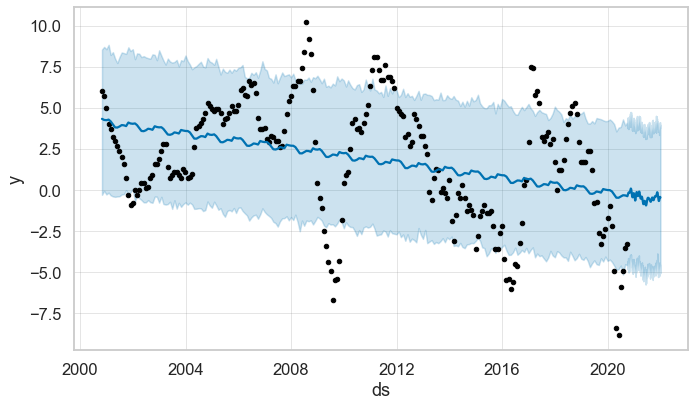

In [86]:
# Plot Forecast
fig1 = model_ppi.plot(forecast_ppi)

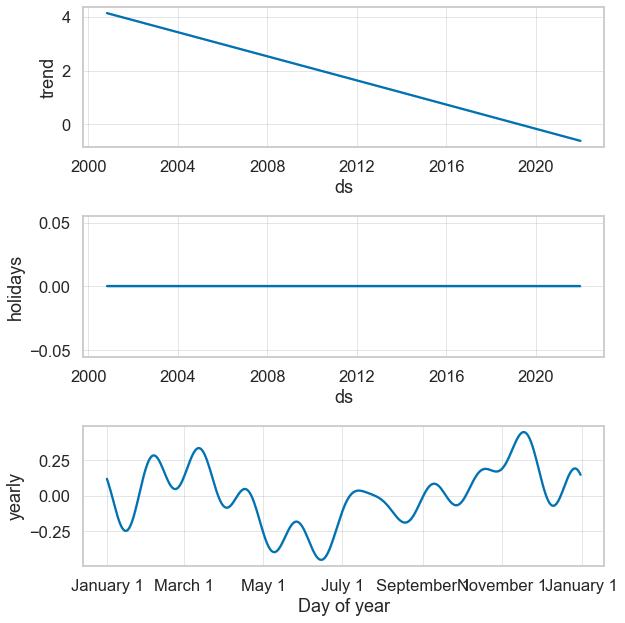

In [87]:
# Forecast components
fig2 = model_ppi.plot_components(forecast_ppi)

***CCI Prediction***

In [88]:
# Python
import pandas as pd
from fbprophet import Prophet

In [89]:
cci_df = pd.read_excel('cci_prediction.xlsx')
cci_df.rename(columns = {'Date':'ds', 'CCI':'y'}, inplace = True) 
cci_df.head()

,ds,y
0,2020-09-30,-26.3
1,2020-08-31,-28.7
2,2020-07-31,-25.6
3,2020-06-30,-25.6
4,2020-05-31,-28.8


In [90]:
# Instantiating a new Prophet object.
model_cci = Prophet()
model_cci.add_country_holidays('ESP')
model_cci.fit(cci_df)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [91]:
# Predictions
future_cci = model_cci.make_future_dataframe(periods=457)
future_cci.tail()

,ds
692,2021-12-27
693,2021-12-28
694,2021-12-29
695,2021-12-30
696,2021-12-31


In [92]:
# Yhat predictions
forecast_cci = model_cci.predict(future_cci)
forecast_cci.head()
#forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Asunción de la Virgen,Asunción de la Virgen_lower,Asunción de la Virgen_upper,Año nuevo,...,holidays,holidays_lower,holidays_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2000-10-31,-4.045268,-13.191214,7.156178,-4.045268,-4.045268,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.657937,0.657937,0.657937,0.0,0.0,0.0,-3.387331
1,2000-11-30,-4.213123,-13.641063,5.430723,-4.213123,-4.213123,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.327513,0.327513,0.327513,0.0,0.0,0.0,-3.885610
2,2000-12-31,-4.386574,-13.771150,5.926208,-4.386574,-4.386574,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.252433,0.252433,0.252433,0.0,0.0,0.0,-4.134141
3,2001-01-31,-4.560025,-13.685731,6.367451,-4.560025,-4.560025,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.489895,0.489895,0.489895,0.0,0.0,0.0,-4.070130
4,2001-02-28,-4.716690,-13.993311,5.244233,-4.716690,-4.716690,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.492922,0.492922,0.492922,0.0,0.0,0.0,-4.223768


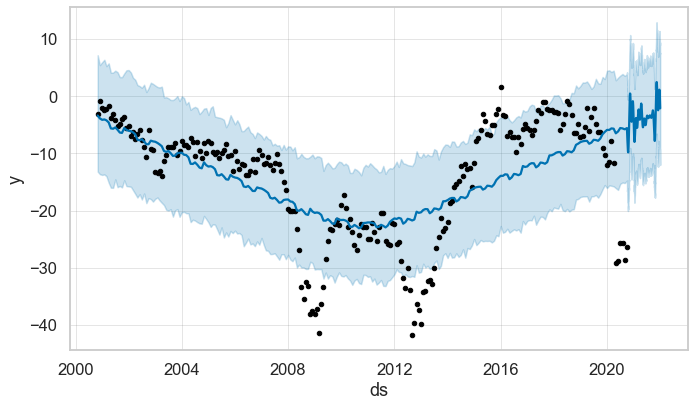

In [93]:
# Plot Forecast
fig1 = model_cci.plot(forecast_cci)

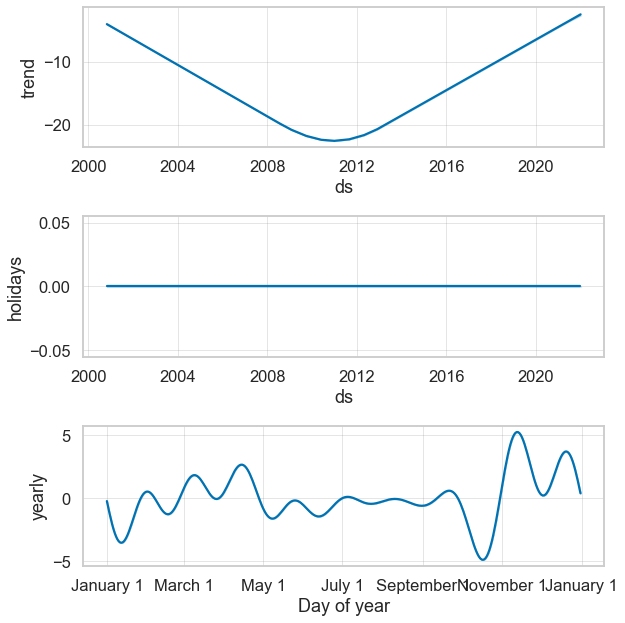

In [94]:
# Forecast components
fig2 = model_cci.plot_components(forecast_cci)

In [95]:
#forecast_cci.to_csv('cci_prediction_esp')

***Import PPI and CCI***

In [96]:
ppi_df = pd.read_csv("ppi_prediction.csv")
ppi_df.head()

,ds,ppi
0,1/1/2021,-0.268560
1,1/2/2021,-0.296272
2,1/3/2021,-0.327001
3,1/4/2021,-0.360033
4,1/5/2021,-0.394581


In [97]:
ppi_df['WEEK'] = pd.DatetimeIndex(ppi_df['ds']).weekofyear

In [98]:
ppi_df['YEAR'] = pd.DatetimeIndex(ppi_df['ds']).year

In [99]:
ppi_df = ppi_df.pivot_table(["ppi","YEAR"],index="WEEK")

In [100]:
ppi_df.tail()

,YEAR,ppi
WEEK,,
49,2021,-0.656533
50,2021,-0.594110
51,2021,-0.453351
52,2021,-0.436142
53,2021,-0.297278


In [101]:
ppi_df = ppi_df.reset_index()

In [102]:
ppi_df.WEEK = ppi_df["WEEK"].astype(int)
dates = ppi_df.YEAR*100+ppi_df.WEEK
ppi_df['Date'] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

In [103]:
ppi_df.head()

,WEEK,YEAR,ppi,Date
0,1,2021,-0.462729,2021-01-10
1,2,2021,-0.625212,2021-01-17
2,3,2021,-0.553926,2021-01-24
3,4,2021,-0.313510,2021-01-31
4,5,2021,-0.144698,2021-02-07


CCI Dataset

In [104]:
cci_df = pd.read_csv("cci_prediction.csv")
cci_df.head()

,ds,cci
0,1/1/2021,-4.747400
1,1/2/2021,-5.230589
2,1/3/2021,-5.698076
3,1/4/2021,-6.140865
4,1/5/2021,-6.550569


In [105]:
cci_df['WEEK'] = pd.DatetimeIndex(cci_df['ds']).weekofyear

In [106]:
cci_df['YEAR'] = pd.DatetimeIndex(cci_df['ds']).year

In [107]:
cci_df = cci_df.pivot_table(["cci","YEAR"],index="WEEK")

In [108]:
cci_df.tail()

,YEAR,cci
WEEK,,
49,2021,-1.307491
50,2021,0.594236
51,2021,0.739239
52,2021,-1.201200
53,2021,-5.225355


In [109]:
cci_df = cci_df.reset_index()

In [110]:
cci_df.WEEK = cci_df["WEEK"].astype(int)
dates = cci_df.YEAR*100+cci_df.WEEK
cci_df['Date'] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

In [111]:
cci_df.head()

,WEEK,YEAR,cci,Date
0,1,2021,-7.137264,2021-01-10
1,2,2021,-7.774224,2021-01-17
2,3,2021,-6.120167,2021-01-24
3,4,2021,-4.269693,2021-01-31
4,5,2021,-4.017762,2021-02-07


Merge CCI and PPI as memt_df

In [112]:
memt_df = ppi_df.merge(cci_df, left_on=['WEEK','YEAR','Date'], right_on=['WEEK','YEAR','Date'], how = 'left')

In [113]:
memt_df.head()

,WEEK,YEAR,ppi,Date,cci
0,1,2021,-0.462729,2021-01-10,-7.137264
1,2,2021,-0.625212,2021-01-17,-7.774224
2,3,2021,-0.553926,2021-01-24,-6.120167
3,4,2021,-0.313510,2021-01-31,-4.269693
4,5,2021,-0.144698,2021-02-07,-4.017762


Merge the two macroeconomic datasets

In [114]:
met_df = meqt_df.merge(memt_df, left_on=['YEAR','WEEK','Date'], right_on=['YEAR','WEEK','Date'], how = 'left')

In [115]:
met_df.isnull().sum()

YEAR          0
QUARTER       0
MONTH         0
WEEK          0
GDP           0
CPI           0
unemp_rate    0
Date          0
ppi           0
cci           0
dtype: int64

In [116]:
met_df = met_df.set_index("Date")

In [117]:
met_df = met_df.drop(['YEAR','WEEK','QUARTER','MONTH'],axis="columns")

In [118]:
met_df.head()

,GDP,CPI,unemp_rate,ppi,cci
Date,,,,,
2021-01-10,-0.035,-0.003,0.185,-0.462729,-7.137264
2021-01-17,-0.035,-0.003,0.185,-0.625212,-7.774224
2021-01-24,-0.035,-0.003,0.185,-0.553926,-6.120167
2021-01-31,-0.035,-0.003,0.185,-0.313510,-4.269693
2021-02-07,-0.035,-0.003,0.185,-0.144698,-4.017762


### COVID & HORECA Predictions

COVID Cases

In [119]:
covid_pred = pd.read_csv("covid_pred.csv")
covid_pred.head()

,YEAR,WEEK,covid_cases
0,2021,Week 1,98412
1,2021,Week 2,100380
2,2021,Week 3,102388
3,2021,Week 4,104435
4,2021,Week 5,106524


In [120]:
covid_pred.WEEK = covid_pred["WEEK"].str.split("Week ", n=1).str.get(1)
covid_pred.WEEK = covid_pred["WEEK"].astype(int)
dates = covid_pred.YEAR*100+covid_pred.WEEK
covid_pred['Date'] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

In [121]:
covid_pred = covid_pred.set_index("Date")
covid_pred = covid_pred.drop(['YEAR','WEEK'],axis="columns")

In [122]:
covid_pred.head()

,covid_cases
Date,
2021-01-10,98412
2021-01-17,100380
2021-01-24,102388
2021-01-31,104435
2021-02-07,106524


HORECA Index

In [123]:
horeca_pred = pd.read_excel("horeca_pred.xlsx")
horeca_pred.head()

,YEAR,QUARTER,MONTH,WEEK,horeca_adj
0,2021,Q1,ENERO,Week 1,-20.3
1,2021,NaN,NaN,Week 2,-20.3
2,2021,NaN,NaN,Week 3,-20.3
3,2021,NaN,NaN,Week 4,-20.3
4,2021,NaN,NaN,Week 5,-20.3


In [124]:
horeca_pred.WEEK = horeca_pred["WEEK"].str.split("Week ", n=1).str.get(1)
horeca_pred.WEEK = horeca_pred["WEEK"].astype(int)
dates = horeca_pred.YEAR*100+horeca_pred.WEEK
horeca_pred = horeca_pred.drop(["QUARTER","MONTH"],axis='columns')
horeca_pred["Date"] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

In [125]:
horeca_pred = horeca_pred.set_index("Date")
horeca_pred = horeca_pred.drop(['YEAR','WEEK'],axis="columns")

In [126]:
horeca_pred.head()

,horeca_adj
Date,
2021-01-10,-20.3
2021-01-17,-20.3
2021-01-24,-20.3
2021-01-31,-20.3
2021-02-07,-20.3


### Joining the dataframes to make the test set

In [127]:
test_df = test_df.merge(weather_pred, left_on='Date', right_on='Date', how = 'left')

In [128]:
test_df = test_df.merge(met_df, left_on='Date', right_on='Date', how = 'left')

In [129]:
test_df = test_df.merge(covid_pred, left_on='Date', right_on='Date', how = 'left')

In [130]:
test_df = test_df.merge(horeca_pred, left_on='Date', right_on='Date', how = 'left')

In [131]:
test_df.shape

(84058, 18)

In [132]:
test_df.head()

,GEOGRAPHY,DEPARTAMENTO,SECCION,FAMILIA,CATEGORIA,year,month,week,Date,temp_avg,rain,GDP,CPI,unemp_rate,ppi,cci,covid_cases,horeca_adj
0,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3
1,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3
2,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3
3,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL POLVO (KG),2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3
4,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,PAPILLAS (L/KG),2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3


In [133]:
test_df.isnull().sum()

GEOGRAPHY       0
DEPARTAMENTO    0
SECCION         0
FAMILIA         0
CATEGORIA       0
year            0
month           0
week            0
Date            0
temp_avg        0
rain            0
GDP             0
CPI             0
unemp_rate      0
ppi             0
cci             0
covid_cases     0
horeca_adj      0
dtype: int64

In [134]:
test_df.rename(columns={'GEOGRAPHY':'geography','DEPARTAMENTO':'department','SECCION':'section','FAMILIA':'family','CATEGORIA':'category',
                        'GDP':'gdp','CPI':'cpi','Date':'date'},inplace=True)

In [135]:
test_df.columns

Index(['geography', 'department', 'section', 'family', 'category', 'year',
       'month', 'week', 'date', 'temp_avg', 'rain', 'gdp', 'cpi', 'unemp_rate',
       'ppi', 'cci', 'covid_cases', 'horeca_adj'],
      dtype='object')

In [136]:
test_df.head(3)

,geography,department,section,family,category,year,month,week,date,temp_avg,rain,gdp,cpi,unemp_rate,ppi,cci,covid_cases,horeca_adj
0,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3
1,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3
2,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3


# 3. Explorative Data Analysis (EDA)

In [138]:
#import warnings
import warnings 
warnings.filterwarnings('ignore')

report = pandas_profiling.ProfileReport(train_df)
report

# 4.1. Visualizations

## 4.1.1. Overall sales volume over time

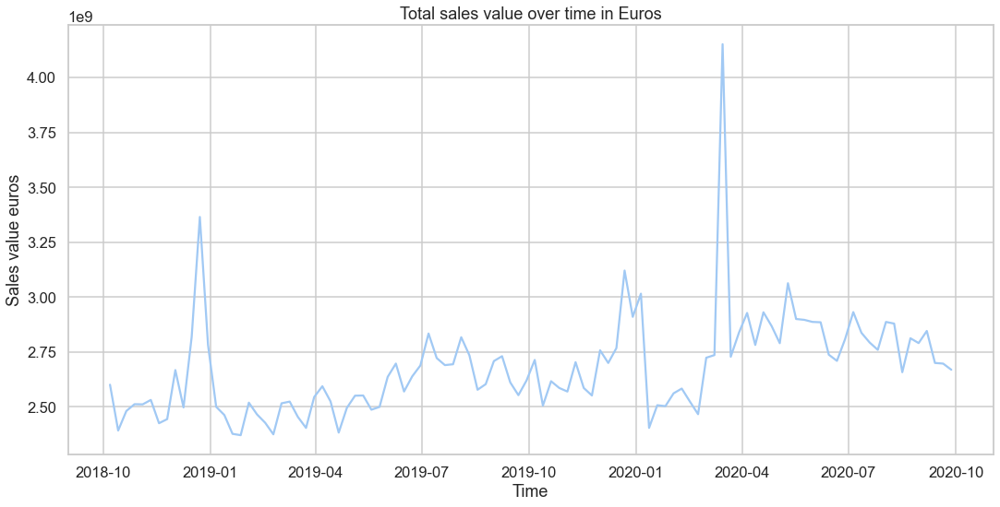

In [244]:
ts=train_df.groupby(["date"])["sales_value_euros"].sum()
ts.astype('float')
plt.figure(figsize=(16,8))
plt.title('Total sales value over time in Euros')
plt.xlabel('Time')
plt.ylabel('Sales value euros')
plt.plot(ts);

## 4.1.2. Total spain department sales volume over time

In [144]:
total_spain_df = train_df[train_df['geography'] == 'TOTAL ESPANA']

In [145]:
#select biggest 2 total spain departments
total_spain_main_dep_1_df = total_spain_df[total_spain_df.department.isin([ 'BEBIDAS', 'FRESCOS',])]

#select remaining 3 total spain departments
total_spain_main_dep_2_df = total_spain_df[total_spain_df.department.isin([ 'ALIMENTACION','DROGUERIA Y LIMPIEZA','PERFUMERIA E HIGIENE',])]

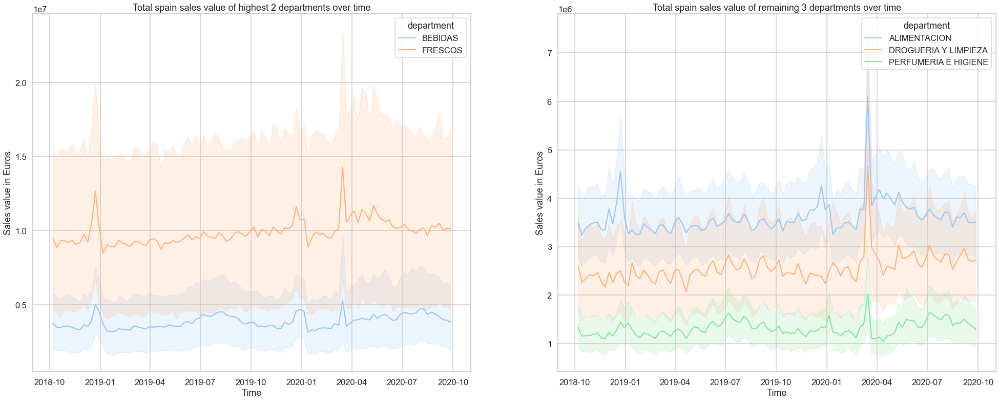

In [248]:
# graph setup
sns.set_palette('pastel')
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(30,12))

ax1 = sns.lineplot(x=total_spain_main_dep_1_df["date"], y=total_spain_main_dep_1_df["sales_value_euros"], hue=total_spain_main_dep_1_df["department"], data=total_spain_main_dep_1_df, ax=ax1,);
ax2 = sns.lineplot(x=total_spain_main_dep_2_df["date"], y=total_spain_main_dep_2_df["sales_value_euros"], hue=total_spain_main_dep_2_df["department"], data=total_spain_main_dep_2_df, ax=ax2,);

ax1.set(xlabel='Time', ylabel='Sales value in Euros', title="Total spain sales value of highest 2 departments over time", label='big',);
ax2.set(xlabel='Time', ylabel='Sales value in Euros', title="Total spain sales value of remaining 3 departments over time", label='big',);

## 4.1.3. Online department sales volume over time

In [249]:
#create dataframe for online departments only
online_df = train_df[train_df['geography'] == 'TOTAL ONLINE']

In [250]:
#select biggest 2 online departments
online_main_dep_1_df = online_df[online_df.department.isin([ 'BEBIDAS', 'FRESCOS',])]

#select remaining 3 online departments
online_main_dep_2_df = online_df[online_df.department.isin([ 'ALIMENTACION','DROGUERIA Y LIMPIEZA','PERFUMERIA E HIGIENE',])]

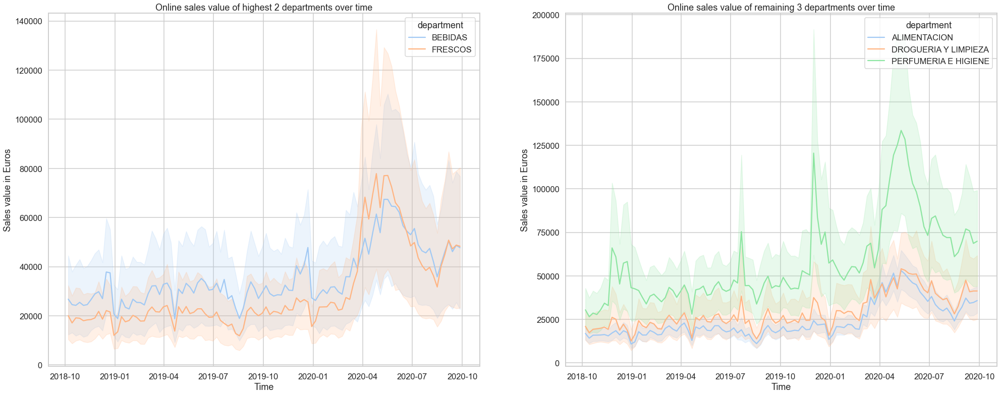

In [251]:
# graph setup
sns.set_palette('pastel')
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(30,12))

ax1 = sns.lineplot(x=online_main_dep_1_df["date"], y=online_main_dep_1_df["sales_value_euros"], hue=online_main_dep_1_df["department"], data=online_main_dep_1_df, ax=ax1,);
ax2 = sns.lineplot(x=online_main_dep_2_df["date"], y=online_main_dep_2_df["sales_value_euros"], hue=online_main_dep_2_df["department"], data=online_main_dep_2_df, ax=ax2,);

ax1.set(xlabel='Time', ylabel='Sales value in Euros', title="Online sales value of highest 2 departments over time", label='big',);
ax2.set(xlabel='Time', ylabel='Sales value in Euros', title="Online sales value of remaining 3 departments over time", label='big',);

## 4.1.4. Hiper department sales volume over time

In [252]:
#create dataframe for hiper only
hiper_df = train_df[train_df['geography'] == 'HIPER']

In [253]:
#select biggest 2 hiper departments
hiper_dep_1_df = hiper_df[hiper_df.department.isin([ 'BEBIDAS',  'FRESCOS',])]

#select middle 3 hiper departments
hiper_dep_2_df = hiper_df[hiper_df.department.isin(['ALIMENTACION',  'DROGUERIA Y LIMPIEZA', 'PERFUMERIA E HIGIENE',])]

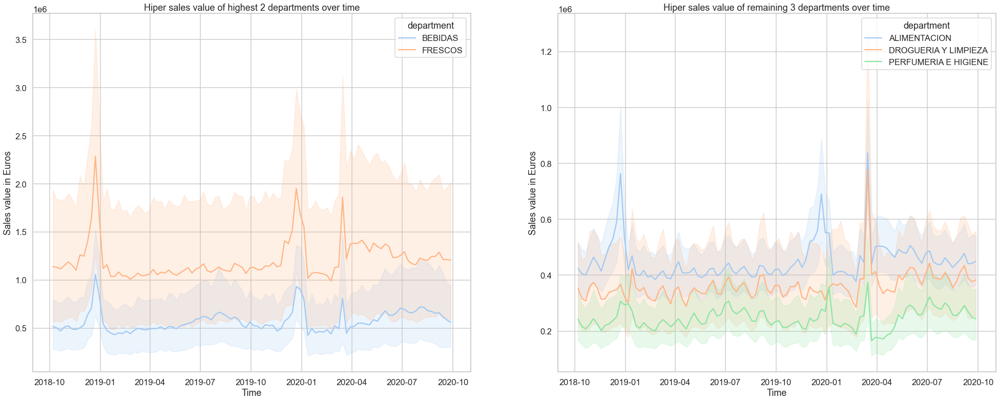

In [254]:
# graph setup
sns.set_palette('pastel')
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(30,12))

ax1 = sns.lineplot(x=hiper_dep_1_df["date"], y=hiper_dep_1_df["sales_value_euros"], hue=hiper_dep_1_df["department"], data=hiper_dep_1_df, ax=ax1,);
ax2 = sns.lineplot(x=hiper_dep_2_df["date"], y=hiper_dep_2_df["sales_value_euros"], hue=hiper_dep_2_df["department"], data=hiper_dep_2_df, ax=ax2,);

ax1.set(xlabel='Time', ylabel='Sales value in Euros', title="Hiper sales value of highest 2 departments over time", label='big',);
ax2.set(xlabel='Time', ylabel='Sales value in Euros', title="Hiper sales value of remaining 3 departments over time", label='big',);

## 4.1.5. PDM department sales volume over time

In [165]:
#create dataframe for online only
#pdm_df = train_df[train_df['geography'] == 'PDM']

In [162]:
#pdm_dep_df = pdm_df[pdm_df.department.isin([ 'BEBIDAS', 'DROGUERIA Y LIMPIEZA', 'PERFUMERIA E HIGIENE',])]

In [164]:
# graph setup
#plt.figure(figsize=(15, 10),)
#sns.set_palette('pastel')

#ax = sns.lineplot(x=pdm_dep_df["date"], y=pdm_dep_df["sales_volume"], hue=pdm_dep_df["department"], data=pdm_dep_df);

#ax.set(xlabel='Time', ylabel='Sales volume', title="Hyper Sales Volume of selected departments over time", label='big',);

## 4.1.6 Online selected 8 categories sales volume over time

In [255]:
#create dataframe for online only
online_df = train_df[train_df['geography'] == 'TOTAL ONLINE']

In [256]:
#select biggest 3 online categories
online_main_categories_1_df = online_df[online_df.category.isin(['ACEITE DE OLIVA (L)', 'CERVEZAS (L)', 'LECHE LARGA CONSERVA (L)',])]

#select middle 3 online categories
online_main_categories_2_df = online_df[online_df.category.isin(['GALLETAS DESAYUNO (KG)','ATUN EN CONSERVA (KG)','LAVAVAJILLA LIQUIDO MANO (L)',])]

#select lowest 2 online categories
online_main_categories_3_df = online_df[online_df.category.isin(['CAFE/CHOCOLATE CAPSULAS (KG)', 'CHAMPU (L)',])]

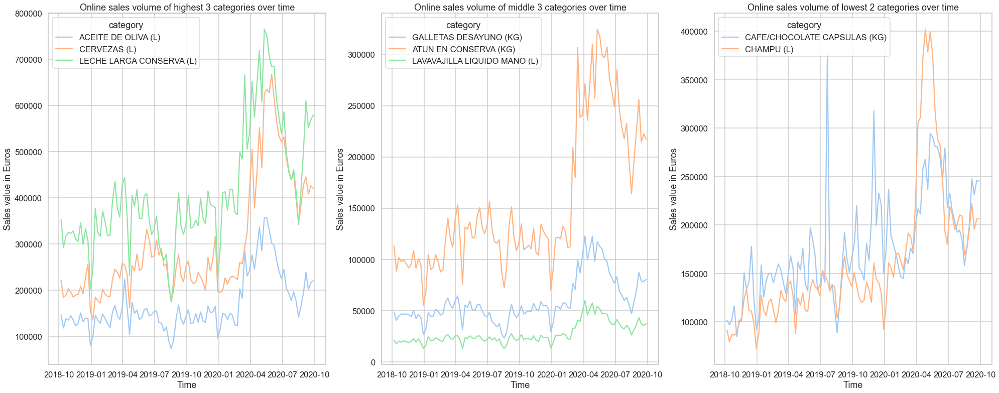

In [257]:
# graph setup
sns.set_palette('pastel')
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(30,12))

ax1 = sns.lineplot(x=online_main_categories_1_df["date"], y=online_main_categories_1_df["sales_value_euros"], hue=online_main_categories_1_df["category"], data=online_main_categories_1_df, ax=ax1,);
ax2 = sns.lineplot(x=online_main_categories_2_df["date"], y=online_main_categories_2_df["sales_value_euros"], hue=online_main_categories_2_df["category"], data=online_main_categories_2_df, ax=ax2,);
ax3 = sns.lineplot(x=online_main_categories_3_df["date"], y=online_main_categories_3_df["sales_value_euros"], hue=online_main_categories_3_df["category"], data=online_main_categories_3_df, ax=ax3,);

ax1.set(xlabel='Time', ylabel='Sales value in Euros', title="Online sales volume of highest 3 categories over time", label='big',);
ax2.set(xlabel='Time', ylabel='Sales value in Euros', title="Online sales volume of middle 3 categories over time", label='big',);
ax3.set(xlabel='Time', ylabel='Sales value in Euros', title="Online sales volume of lowest 2 categories over time", label='big',);

## 4.1.7 Total Spain selected 8 categories sales volume over time

In [258]:
total_spain_df = train_df[train_df['geography'] == 'TOTAL ESPANA']

In [259]:
#select biggest 2 online categories
total_spain_main_categories_1_df = total_spain_df[total_spain_df.category.isin(['CERVEZAS (L)', 'LECHE LARGA CONSERVA (L)',])]

#select middle 4 online categories
total_spain_main_categories_2_df = total_spain_df[total_spain_df.category.isin(['GALLETAS DESAYUNO (KG)','ATUN EN CONSERVA (KG)','LAVAVAJILLA LIQUIDO MANO (L)', 'ACEITE DE OLIVA (L)',])]

#select lowest 2 online categories
total_spain_main_categories_3_df = total_spain_df[total_spain_df.category.isin(['CAFE/CHOCOLATE CAPSULAS (KG)', 'CHAMPU (L)',])]

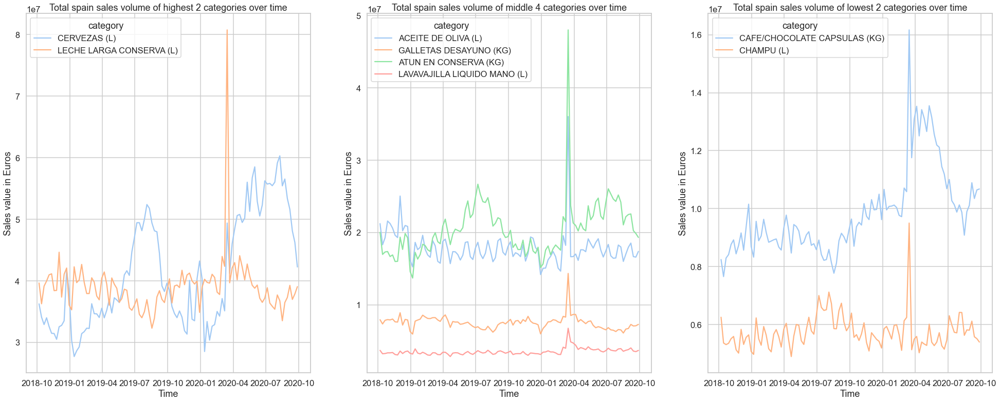

In [260]:
# graph setup
sns.set_palette('pastel')
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(30,12))

ax1 = sns.lineplot(x=total_spain_main_categories_1_df["date"], y=total_spain_main_categories_1_df["sales_value_euros"], hue=total_spain_main_categories_1_df["category"], data=total_spain_main_categories_1_df, ax=ax1,);
ax2 = sns.lineplot(x=total_spain_main_categories_2_df["date"], y=total_spain_main_categories_2_df["sales_value_euros"], hue=total_spain_main_categories_2_df["category"], data=total_spain_main_categories_2_df, ax=ax2,);
ax3 = sns.lineplot(x=total_spain_main_categories_3_df["date"], y=total_spain_main_categories_3_df["sales_value_euros"], hue=total_spain_main_categories_3_df["category"], data=total_spain_main_categories_3_df, ax=ax3,);

ax1.set(xlabel='Time', ylabel='Sales value in Euros', title="Total spain sales volume of highest 2 categories over time", label='big',);
ax2.set(xlabel='Time', ylabel='Sales value in Euros', title="Total spain sales volume of middle 4 categories over time", label='big',);
ax3.set(xlabel='Time', ylabel='Sales value in Euros', title="Total spain sales volume of lowest 2 categories over time", label='big',);

# 4.2. Feature Factorization

***Season Feature on the Train***

In [172]:
#create season column
train_df['season'] = (train_df["date"].dt.month%12 + 3)//3

In [173]:
train_df.head()

,geography,department,section,family,category,sales_units,sales_value_euros,sales_volume,date,year,...,gdp,unemp_rate,ppi,cpi,cci,rain,temp_avg,covid_cases,horeca_adj,season
0,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),640432,3992668,1093703,2018-10-07,2018,...,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1,4
1,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),255111,451289,384694,2018-10-07,2018,...,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1,4
2,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),102114,179923,121847,2018-10-07,2018,...,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1,4
3,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL POLVO (KG),31084,482948,28179,2018-10-07,2018,...,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1,4
4,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,PAPILLAS (L/KG),40943,183145,30310,2018-10-07,2018,...,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1,4


***Season Feature on the Test***

In [174]:
#create season column
test_df['season'] = (test_df["date"].dt.month%12 + 3)//3

In [175]:
test_df = test_df.drop(["geography","department","family","category","section"],axis="columns")

In [176]:
test_df.head()

,year,month,week,date,temp_avg,rain,gdp,cpi,unemp_rate,ppi,cci,covid_cases,horeca_adj,season
0,2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3,1
1,2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3,1
2,2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3,1
3,2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3,1
4,2021,1,1,2021-01-10,5.9239,0.0713,-0.035,-0.003,0.185,-0.462729,-7.137264,98412,-20.3,1


In [177]:
test_df = test_df.groupby(by="date").max()

In [181]:
#test_df.to_csv("testset.csv")

In [182]:
train_df.columns

Index(['geography', 'department', 'section', 'family', 'category',
       'sales_units', 'sales_value_euros', 'sales_volume', 'date', 'year',
       'month', 'week', 'gdp', 'unemp_rate', 'ppi', 'cpi', 'cci', 'rain',
       'temp_avg', 'covid_cases', 'horeca_adj', 'season'],
      dtype='object')

In [183]:
test_df.columns

Index(['year', 'month', 'week', 'temp_avg', 'rain', 'gdp', 'cpi', 'unemp_rate',
       'ppi', 'cci', 'covid_cases', 'horeca_adj', 'season'],
      dtype='object')

# Modeling and predictions

In [83]:
train_updated = pd.read_csv("final_train.csv")
train_updated.head()

,Unnamed: 0,geography,department,section,family,category,sales_units,sales_value_euros,sales_volume,date,...,gdp,unemp_rate,ppi,cpi,cci,rain,temp_avg,covid_cases,horeca_adj,season
0,0,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,ACEITE DE OLIVA (L),640432,3992668,1093703,2018-10-07,...,0.023,0.1445,4.6,2.3,-6.5,0.5524,17.8194,0.0,7.1,4
1,1,HIPER,ALIMENTACION,ALIMENTACION SECA,ACEITES,OTROS ACEITES (L),255111,451289,384694,2018-10-07,...,0.023,0.1445,4.6,2.3,-6.5,0.5524,17.8194,0.0,7.1,4
2,2,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL LIQUIDO (L),102114,179923,121847,2018-10-07,...,0.023,0.1445,4.6,2.3,-6.5,0.5524,17.8194,0.0,7.1,4
3,3,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,LECHE INFANTIL POLVO (KG),31084,482948,28179,2018-10-07,...,0.023,0.1445,4.6,2.3,-6.5,0.5524,17.8194,0.0,7.1,4
4,4,HIPER,ALIMENTACION,ALIMENTACION SECA,ALIMENTACION INFANTIL,PAPILLAS (L/KG),40943,183145,30310,2018-10-07,...,0.023,0.1445,4.6,2.3,-6.5,0.5524,17.8194,0.0,7.1,4


In [184]:
#import libraries
from sklearn.pipeline import Pipeline
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import xgboost
from sklearn import svm
from sklearn.svm import SVR
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

`Function to do the adjustments to train set:

In [185]:
# date_1 : date_2 -> the dates between which you want to trim. (SAME WEEKLY DATE AS IN TRAIN!)
# data = dataframe that you are trimming 
# number of deviations to add from previous year (positive or negative to increase or decrease example: 1.5 means adding 1.5 std to the value from 2019)
def trimmer ( date_1, date_2, data, no_deviation) :
        date_1 =  pd.to_datetime(date_1)
        date_2 =  pd.to_datetime(date_2)

        year_1 = date_1.year
        #year_2 = date_2.year
        #month_1 = date_1.month
        #month_2 = date_2.month
        week_1 = date_1.week
        week_2 = date_2.week

        no_weeks = week_2 - week_1
        i = 1

        while i <= no_weeks :
            week = week_1
            x =  data.loc[((data.year == year_1 -1 )   & (data.week == week )), 'sales_value_euros']
            std = data.loc[((data.year == year_1 -1 )   & (data.week == week )), 'sales_value_euros_std']

            demand = x + no_deviation*std
            
            data.loc[(data.year == year_1 )   & (data.week == week ), 'sales_value_euros'] = demand.item()

            week = week + 1
            i = i +1
        return data

### Create the training set: 

In [233]:
# Total BEBIDAS: 
# choose which geography and which department/ category 
oliva_total_spain_s1 = train_df[(train_df['geography'] == 'TOTAL ESPANA') & (train_df['category'] == 'ACEITE DE OLIVA (L)')] #(train_df['category'] == 'xxx')

#adjust just dataset name below to create train set (BIBIDAS_spain = )
oliva_total_spain_s1 = oliva_total_spain_s1.groupby(
        ['date', 'year', 'month','week'], 
        ).agg(
        
            sales_value_euros = pd.NamedAgg(column = 'sales_value_euros', aggfunc = sum),
            sales_value_euros_std = pd.NamedAgg(column = 'sales_value_euros', aggfunc = 'std'),
            gdp = pd.NamedAgg(column = 'gdp',aggfunc = max), 
            unemp_rate = pd.NamedAgg(column = 'unemp_rate',aggfunc = max),            
            ppi = pd.NamedAgg(column = 'ppi', aggfunc = max),            
            cpi = pd.NamedAgg(column = 'cpi', aggfunc = max),            
            cci = pd.NamedAgg(column = 'cci',aggfunc = max),            
            rain = pd.NamedAgg(column = 'rain',aggfunc = max),            
            temp_avg = pd.NamedAgg(column = 'temp_avg', aggfunc =max),            
            covid_cases = pd.NamedAgg(column = 'covid_cases', aggfunc =max),            
            horeca_adj = pd.NamedAgg(column = 'horeca_adj',aggfunc = max),
            season = pd.NamedAgg(column = 'season',aggfunc = max),


)
oliva_total_spain_s1 = oliva_total_spain_s1.reset_index()

oliva_total_spain_s1.head()

,date,year,month,week,sales_value_euros,sales_value_euros_std,gdp,unemp_rate,ppi,cpi,cci,rain,temp_avg,covid_cases,horeca_adj,season
0,2018-10-07,2018,10,40,21215247,NaN,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1,4
1,2018-10-14,2018,10,41,18300078,NaN,0.023,0.1445,4.6,-6.5,-6.5,4.5480,16.9946,0.0,7.1,4
2,2018-10-21,2018,10,42,19266982,NaN,0.023,0.1445,4.6,-6.5,-6.5,4.7054,15.3302,0.0,7.1,4
3,2018-10-28,2018,10,43,21578317,NaN,0.023,0.1445,4.6,-6.5,-6.5,2.2240,13.4304,0.0,7.1,4
4,2018-11-04,2018,11,44,21232611,NaN,0.023,0.1445,2.9,-4.9,-4.9,4.6888,9.7694,0.0,7.1,4


In [234]:
test_df.columns

Index(['year', 'month', 'week', 'temp_avg', 'rain', 'gdp', 'cpi', 'unemp_rate',
       'ppi', 'cci', 'covid_cases', 'horeca_adj', 'season'],
      dtype='object')

In [235]:
list(oliva_total_spain_s1.date)

[Timestamp('2018-10-07 00:00:00'),
 Timestamp('2018-10-14 00:00:00'),
 Timestamp('2018-10-21 00:00:00'),
 Timestamp('2018-10-28 00:00:00'),
 Timestamp('2018-11-04 00:00:00'),
 Timestamp('2018-11-11 00:00:00'),
 Timestamp('2018-11-18 00:00:00'),
 Timestamp('2018-11-25 00:00:00'),
 Timestamp('2018-12-02 00:00:00'),
 Timestamp('2018-12-09 00:00:00'),
 Timestamp('2018-12-16 00:00:00'),
 Timestamp('2018-12-23 00:00:00'),
 Timestamp('2018-12-30 00:00:00'),
 Timestamp('2019-01-06 00:00:00'),
 Timestamp('2019-01-13 00:00:00'),
 Timestamp('2019-01-20 00:00:00'),
 Timestamp('2019-01-27 00:00:00'),
 Timestamp('2019-02-03 00:00:00'),
 Timestamp('2019-02-10 00:00:00'),
 Timestamp('2019-02-17 00:00:00'),
 Timestamp('2019-02-24 00:00:00'),
 Timestamp('2019-03-03 00:00:00'),
 Timestamp('2019-03-10 00:00:00'),
 Timestamp('2019-03-17 00:00:00'),
 Timestamp('2019-03-24 00:00:00'),
 Timestamp('2019-03-31 00:00:00'),
 Timestamp('2019-04-07 00:00:00'),
 Timestamp('2019-04-14 00:00:00'),
 Timestamp('2019-04-

In [236]:
oliva_total_spain_s1 = trimmer("2020-02-23",'2020-04-12',oliva_total_spain_s1,0  )  # train data set for bibidas in total spain scenario 1 

In [238]:
oliva_total_spain_s1.fillna(oliva_total_spain_s1.mean())

,date,year,month,week,sales_value_euros,sales_value_euros_std,gdp,unemp_rate,ppi,cpi,cci,rain,temp_avg,covid_cases,horeca_adj,season
0,2018-10-07,2018,10,40,21215247.0,NaN,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1,4
1,2018-10-14,2018,10,41,18300078.0,NaN,0.023,0.1445,4.6,-6.5,-6.5,4.5480,16.9946,0.0,7.1,4
2,2018-10-21,2018,10,42,19266982.0,NaN,0.023,0.1445,4.6,-6.5,-6.5,4.7054,15.3302,0.0,7.1,4
3,2018-10-28,2018,10,43,21578317.0,NaN,0.023,0.1445,4.6,-6.5,-6.5,2.2240,13.4304,0.0,7.1,4
4,2018-11-04,2018,11,44,21232611.0,NaN,0.023,0.1445,2.9,-4.9,-4.9,4.6888,9.7694,0.0,7.1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,2020-08-30,2020,8,35,17949213.0,NaN,-0.116,0.1650,-3.5,-28.7,-28.7,1.2504,22.7324,6203.0,-15.3,3
100,2020-09-06,2020,9,36,18531330.0,NaN,-0.116,0.1650,-3.3,-26.3,-26.3,0.1598,21.2544,7277.0,-15.3,4
101,2020-09-13,2020,9,37,16661957.0,NaN,-0.116,0.1650,-3.3,-26.3,-26.3,0.5426,21.7992,7826.0,-15.3,4
102,2020-09-20,2020,9,38,16592420.0,NaN,-0.116,0.1650,-3.3,-26.3,-26.3,3.0414,21.3358,7047.0,-15.3,4


In [239]:
oliva_total_spain_s1.isnull().sum()

date                       0
year                       0
month                      0
week                       0
sales_value_euros          1
sales_value_euros_std    104
gdp                        0
unemp_rate                 0
ppi                        0
cpi                        0
cci                        0
rain                       0
temp_avg                   0
covid_cases                0
horeca_adj                 0
season                     0
dtype: int64

In [ ]:
# bebidas_total_spain_S1.to_csv('bebidas_total_spain_S1.csv')
# test_df.to_csv('test_df_1.csv')

## XGBOOST

In [ ]:
# test_df = test_df.reset_index()
# test_df = test_df.drop('date', axis = 1)

In [192]:
X_train = oliva_total_spain_s1.drop(['sales_value_euros',"sales_value_euros_std", 'date'], axis = 1)
y_train = oliva_total_spain_s1[['sales_value_euros']]
X_test = test_df

In [193]:
X_train.head()

,year,month,week,gdp,unemp_rate,ppi,cpi,cci,rain,temp_avg,covid_cases,horeca_adj,season
0,2018,10,40,0.023,0.1445,4.6,-6.5,-6.5,0.5524,17.8194,0.0,7.1,4
1,2018,10,41,0.023,0.1445,4.6,-6.5,-6.5,4.5480,16.9946,0.0,7.1,4
2,2018,10,42,0.023,0.1445,4.6,-6.5,-6.5,4.7054,15.3302,0.0,7.1,4
3,2018,10,43,0.023,0.1445,4.6,-6.5,-6.5,2.2240,13.4304,0.0,7.1,4
4,2018,11,44,0.023,0.1445,2.9,-4.9,-4.9,4.6888,9.7694,0.0,7.1,4


In [194]:
X_train.shape

(104, 13)

In [195]:
X_train.columns

Index(['year', 'month', 'week', 'gdp', 'unemp_rate', 'ppi', 'cpi', 'cci',
       'rain', 'temp_avg', 'covid_cases', 'horeca_adj', 'season'],
      dtype='object')

In [196]:
y_train.shape

(104, 1)

In [197]:
X_test.shape

(52, 13)

In [198]:
X_test.columns

Index(['year', 'month', 'week', 'temp_avg', 'rain', 'gdp', 'cpi', 'unemp_rate',
       'ppi', 'cci', 'covid_cases', 'horeca_adj', 'season'],
      dtype='object')

In [ ]:
import xgboost
from sklearn.model_selection import RandomizedSearchCV

XG_pipe = Pipeline(steps = [ ('XGBoost', xgboost.XGBRegressor(objective="reg:squarederror", random_state=42,)) ])

params = {
    "XGBoost__colsample_bytree": uniform(0.7, 0.3),
    "XGBoost__gamma": uniform(0, 0.5),
    "XGBoost__learning_rate": uniform(0.03, 0.3), # default 0.1 
    "XGBoost__max_depth": randint(2, 20), # default 3
    "XGBoost__n_estimators": randint(100, 1000), # default 100
    "XGBoost__subsample": uniform(0.1, 0.8),
}
# Create a grid search to try all the possible number of PCs
XG_estimator = RandomizedSearchCV(XG_pipe, 
                               params, 
                               cv=5, 
                               n_iter=200, 
                               n_jobs=-1, 
                               scoring = 'r2' ) 

XG_estimator.fit(X_train, y_train)
print("Randomized Search Finished")

In [ ]:
XG_estimator.best_estimator_

In [ ]:
print("R2 of the model with the optimal hyperparameter configuration = {0:.4f}".format(XG_estimator.best_score_))

In [ ]:
cols = ['year', 'month', 'week', 'gdp', 'unemp_rate', 'ppi', 'cpi', 'cci', 'rain', 'temp_avg', 'covid_cases', 'horeca_adj', 'season']

In [ ]:
X_test = X_test[cols]

In [ ]:
XGboost = xgboost.XGBRegressor ( base_score=0.5, booster='gbtree',
                              colsample_bylevel=1,
                              colsample_bynode=1,
                              colsample_bytree=0.9286498135079525,
                              gamma=0.25819511938288275, 
                              gpu_id=-1,
                              importance_type='gain',
                              interaction_constraints='',
                              learning_rate=0.22887808049097713,
                                max_delta_step=0,
                                max_depth=18,
                                min_child_weight=1,
                               
                                n_estimators=925,
                                n_jobs=0, 
                                num_parallel_tree=1,
                                objective='reg:squarederror', 
                                random_state=42,
                                reg_alpha=0, 
                                reg_lambda=1, scale_pos_weight=1,
                                subsample=0.15591055194102782,
                                tree_method='exact', validate_parameters=1,
                                verbosity=None) # add optimal hyperparameter values 
XGboost.fit(X_train,y_train)

XG_predictions = XGboost.predict(X_test)

In [ ]:
bebidas_total_spain_pred = XG_predictions

In [ ]:
bebidas_total_spain_pred

In [ ]:

plt.figure(figsize=(15, 10),)
sns.set_palette('pastel')

ax = sns.lineplot(x=X_test.week, y=bebidas_total_spain_pred);

ax.set(xlabel='Time', ylabel='Sales volume', title="Hyper Sales Volume of selected departments over time", label='big',);

In [201]:
y_train.isnull().sum()

sales_value_euros    1
dtype: int64

 # RF

In [199]:
from sklearn.model_selection import RandomizedSearchCV

RF_pipe = Pipeline(steps = [ ('RF', RandomForestRegressor(random_state=42)) ])

params = {
    'RF__bootstrap':         [True, False],
    'RF__max_depth':         randint(5,30),
    'RF__max_features':      ['sqrt', 'log2'],
    'RF__min_samples_leaf':  [1, 2, 5],
    'RF__min_samples_split': [2, 3, 5],
    'RF__n_estimators':      [ 200,500, 750, 1000, 1500],
   
}
# Create a grid search to try all the possible number of PCs
estimator = RandomizedSearchCV(RF_pipe, 
                               params, 
                               cv=3, 
                               n_iter=100, 
                               n_jobs=-1, 
                               scoring = 'r2' ) 

estimator.fit(X_train, y_train)
print("Randomized Search Finished")

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [ ]:
estimator.best_estimator_

In [ ]:
print("R2 of the model with the optimal hyperparameter configuration = {0:.4f}".format(estimator.best_score_))

In [ ]:
RFmodel = RandomForestRegressor(bootstrap=False, max_depth=17,
                                       max_features='sqrt', min_samples_leaf=2,
                                       random_state=42)
RFmodel.fit(X_train,y_train)

In [ ]:
rf_predictions = RFmodel.predict(X_test)

In [ ]:

plt.figure(figsize=(15, 10),)
sns.set_palette('pastel')

ax = sns.lineplot(x=X_test.week, y=rf_predictions);

ax.set(xlabel='Time', ylabel='Sales volume', title="Hyper Sales Volume of selected departments over time", label='big',);

In [ ]:
train_df.department.unique()

# DATAIKU RESULTS

## TOTAL SPAIN ALIMENTACION

In [240]:
alimentacion_total_spain_score_S1 = pd.read_csv('alimentacion_test_score.csv')
alimentacion_total_spain_score_S1.head()

,year,month,week,prediction
0,2021,1,1,7.448312e+08
1,2021,1,2,7.406269e+08
2,2021,1,3,7.405255e+08
3,2021,1,4,7.410002e+08
4,2021,2,5,7.429319e+08


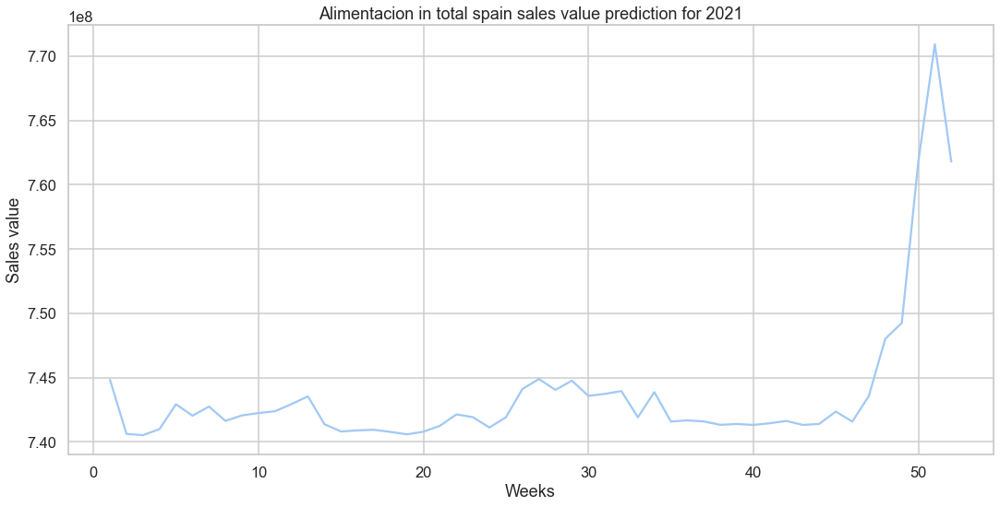

In [242]:
ts=alimentacion_total_spain_score_S1.groupby(["week"])["prediction"].sum()
ts.astype('float')
plt.figure(figsize=(16,8))
plt.title('Alimentacion in total spain sales value prediction for 2021')
plt.xlabel('Weeks')
plt.ylabel('Sales value')
plt.plot(ts);

## TOTAL SPAIN BEBIDAS